## Data Wrangling & Pre-Processing

### Import Libraries and Dataset

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

pd.set_option('display.max_columns', None)

In [2]:
df = pd.read_csv('assets/telecom_customer_churn.csv')
df.head()

,Customer ID,Gender,Age,Married,Number of Dependents,City,Zip Code,Latitude,Longitude,Number of Referrals,Tenure in Months,Offer,Phone Service,Avg Monthly Long Distance Charges,Multiple Lines,Internet Service,Internet Type,Avg Monthly GB Download,Online Security,Online Backup,Device Protection Plan,Premium Tech Support,Streaming TV,Streaming Movies,Streaming Music,Unlimited Data,Contract,Paperless Billing,Payment Method,Monthly Charge,Total Charges,Total Refunds,Total Extra Data Charges,Total Long Distance Charges,Total Revenue,Customer Status,Churn Category,Churn Reason
0,0002-ORFBO,Female,37,Yes,0,Frazier Park,93225,34.827662,-118.999073,2,9,NaN,Yes,42.39,No,Yes,Cable,16.0,No,Yes,No,Yes,Yes,No,No,Yes,One Year,Yes,Credit Card,65.6,593.30,0.00,0,381.51,974.81,Stayed,NaN,NaN
1,0003-MKNFE,Male,46,No,0,Glendale,91206,34.162515,-118.203869,0,9,NaN,Yes,10.69,Yes,Yes,Cable,10.0,No,No,No,No,No,Yes,Yes,No,Month-to-Month,No,Credit Card,-4.0,542.40,38.33,10,96.21,610.28,Stayed,NaN,NaN
2,0004-TLHLJ,Male,50,No,0,Costa Mesa,92627,33.645672,-117.922613,0,4,Offer E,Yes,33.65,No,Yes,Fiber Optic,30.0,No,No,Yes,No,No,No,No,Yes,Month-to-Month,Yes,Bank Withdrawal,73.9,280.85,0.00,0,134.60,415.45,Churned,Competitor,Competitor had better devices
3,0011-IGKFF,Male,78,Yes,0,Martinez,94553,38.014457,-122.115432,1,13,Offer D,Yes,27.82,No,Yes,Fiber Optic,4.0,No,Yes,Yes,No,Yes,Yes,No,Yes,Month-to-Month,Yes,Bank Withdrawal,98.0,1237.85,0.00,0,361.66,1599.51,Churned,Dissatisfaction,Product dissatisfaction
4,0013-EXCHZ,Female,75,Yes,0,Camarillo,93010,34.227846,-119.079903,3,3,NaN,Yes,7.38,No,Yes,Fiber Optic,11.0,No,No,No,Yes,Yes,No,No,Yes,Month-to-Month,Yes,Credit Card,83.9,267.40,0.00,0,22.14,289.54,Churned,Dissatisfaction,Network reliability


### Explore the Dataset

In [3]:
print(f'There is {df.shape[0]} rows and {df.shape[1]} columns!')

There is 7043 rows and 38 columns!


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 38 columns):
 #   Column                             Non-Null Count  Dtype  
---  ------                             --------------  -----  
 0   Customer ID                        7043 non-null   object 
 1   Gender                             7043 non-null   object 
 2   Age                                7043 non-null   int64  
 3   Married                            7043 non-null   object 
 4   Number of Dependents               7043 non-null   int64  
 5   City                               7043 non-null   object 
 6   Zip Code                           7043 non-null   int64  
 7   Latitude                           7043 non-null   float64
 8   Longitude                          7043 non-null   float64
 9   Number of Referrals                7043 non-null   int64  
 10  Tenure in Months                   7043 non-null   int64  
 11  Offer                              3166 non-null   objec

In [5]:
df.describe()

,Age,Number of Dependents,Zip Code,Latitude,Longitude,Number of Referrals,Tenure in Months,Avg Monthly Long Distance Charges,Avg Monthly GB Download,Monthly Charge,Total Charges,Total Refunds,Total Extra Data Charges,Total Long Distance Charges,Total Revenue
count,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,6361.000000,5517.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000
mean,46.509726,0.468692,93486.070567,36.197455,-119.756684,1.951867,32.386767,25.420517,26.189958,63.596131,2280.381264,1.962182,6.860713,749.099262,3034.379056
std,16.750352,0.962802,1856.767505,2.468929,2.154425,3.001199,24.542061,14.200374,19.586585,31.204743,2266.220462,7.902614,25.104978,846.660055,2865.204542
min,19.000000,0.000000,90001.000000,32.555828,-124.301372,0.000000,1.000000,1.010000,2.000000,-10.000000,18.800000,0.000000,0.000000,0.000000,21.360000
25%,32.000000,0.000000,92101.000000,33.990646,-121.788090,0.000000,9.000000,13.050000,13.000000,30.400000,400.150000,0.000000,0.000000,70.545000,605.610000
50%,46.000000,0.000000,93518.000000,36.205465,-119.595293,0.000000,29.000000,25.690000,21.000000,70.050000,1394.550000,0.000000,0.000000,401.440000,2108.640000
75%,60.000000,0.000000,95329.000000,38.161321,-117.969795,3.000000,55.000000,37.680000,30.000000,89.750000,3786.600000,0.000000,0.000000,1191.100000,4801.145000
max,80.000000,9.000000,96150.000000,41.962127,-114.192901,11.000000,72.000000,49.990000,85.000000,118.750000,8684.800000,49.790000,150.000000,3564.720000,11979.340000


#### Explore the Null Values

In [6]:
missing = pd.concat([df.isnull().sum(), 100 * df.isnull().mean()], axis=1)
missing.columns=['count', '%']
missing.sort_values(by='count', ascending=False)

,count,%
Churn Reason,5174,73.463013
Churn Category,5174,73.463013
Offer,3877,55.047565
Internet Type,1526,21.666903
Unlimited Data,1526,21.666903
Streaming Music,1526,21.666903
Streaming Movies,1526,21.666903
Streaming TV,1526,21.666903
Premium Tech Support,1526,21.666903
Device Protection Plan,1526,21.666903


#### Explore the Categorical Features

In [7]:
df.select_dtypes('object').T

0               1     \
Customer ID               0002-ORFBO      0003-MKNFE   
Gender                        Female            Male   
Married                          Yes              No   
City                    Frazier Park        Glendale   
Offer                            NaN             NaN   
Phone Service                    Yes             Yes   
Multiple Lines                    No             Yes   
Internet Service                 Yes             Yes   
Internet Type                  Cable           Cable   
Online Security                   No              No   
Online Backup                    Yes              No   
Device Protection Plan            No              No   
Premium Tech Support             Yes              No   
Streaming TV                     Yes              No   
Streaming Movies                  No             Yes   
Streaming Music                   No             Yes   
Unlimited Data                   Yes              No   
Contract                    One Year  Month-to-Month   
Paperless Billing                Yes              No   
Payment Method           Credit Card     Credit Card   
Customer Status               Stayed          Stayed   
Churn Category                   NaN             NaN   
Churn Reason                     NaN             NaN   

                                                 2     \
Customer ID                                0004-TLHLJ   
Gender                                           Male   
Married                                            No   
City                                       Costa Mesa   
Offer                                         Offer E   
Phone Service                                     Yes   
Multiple Lines                                     No   
Internet Service                                  Yes   
Internet Type                             Fiber Optic   
Online Security                                    No   
Online Backup                                      No   
Device Protection Plan                            Yes   
Premium Tech Support                               No   
Streaming TV                                       No   
Streaming Movies                                   No   
Streaming Music                                    No   
Unlimited Data                                    Yes   
Contract                               Month-to-Month   
Paperless Billing                                 Yes   
Payment Method                        Bank Withdrawal   
Customer Status                               Churned   
Churn Category                             Competitor   
Churn Reason            Competitor had better devices   

                                           3                    4     \
Customer ID                          0011-IGKFF           0013-EXCHZ   
Gender                                     Male               Female   
Married                                     Yes                  Yes   
City                                   Martinez            Camarillo   
Offer                                   Offer D                  NaN   
Phone Service                               Yes                  Yes   
Multiple Lines                               No                   No   
Internet Service                            Yes                  Yes   
Internet Type                       Fiber Optic          Fiber Optic   
Online Security                              No                   No   
Online Backup                               Yes                   No   
Device Protection Plan                      Yes                   No   
Premium Tech Support                         No                  Yes   
Streaming TV                                Yes                  Yes   
Streaming Movies                            Yes                   No   
Streaming Music                              No                   No   
Unlimited Data                              Yes                  Yes   
Contract              

In [8]:
df['Customer Status'].unique()

array(['Stayed', 'Churned', 'Joined'], dtype=object)

In [9]:
churncategory = pd.DataFrame(df['Churn Category'].unique())
churncategory.columns = ['Category of Reason for Leaving']
churncategory.sort_values('Category of Reason for Leaving')

,Category of Reason for Leaving
5,Attitude
1,Competitor
2,Dissatisfaction
3,Other
4,Price
0,NaN


In [10]:
churnreason = pd.DataFrame(df['Churn Reason'].unique())
churnreason.columns = ['Specific Reason for Leaving']
churnreason.sort_values('Specific Reason for Leaving')

,Specific Reason for Leaving
8,Attitude of service provider
9,Attitude of support person
1,Competitor had better devices
5,Competitor made better offer
10,Competitor offered higher download speeds
11,Competitor offered more data
13,Deceased
6,Don't know
19,Extra data charges
12,Lack of affordable download/upload speed


#### Explore the Numerical Feature

In [11]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Age,7043.0,46.509726,16.750352,19.000000,32.000000,46.000000,60.000000,80.000000
Number of Dependents,7043.0,0.468692,0.962802,0.000000,0.000000,0.000000,0.000000,9.000000
Zip Code,7043.0,93486.070567,1856.767505,90001.000000,92101.000000,93518.000000,95329.000000,96150.000000
Latitude,7043.0,36.197455,2.468929,32.555828,33.990646,36.205465,38.161321,41.962127
Longitude,7043.0,-119.756684,2.154425,-124.301372,-121.788090,-119.595293,-117.969795,-114.192901
Number of Referrals,7043.0,1.951867,3.001199,0.000000,0.000000,0.000000,3.000000,11.000000
Tenure in Months,7043.0,32.386767,24.542061,1.000000,9.000000,29.000000,55.000000,72.000000
Avg Monthly Long Distance Charges,6361.0,25.420517,14.200374,1.010000,13.050000,25.690000,37.680000,49.990000
Avg Monthly GB Download,5517.0,26.189958,19.586585,2.000000,13.000000,21.000000,30.000000,85.000000
Monthly Charge,7043.0,63.596131,31.204743,-10.000000,30.400000,70.050000,89.750000,118.750000


### Data Pre-Processing & Training

#### Dealing with Missing Data

In [12]:
missing1 = pd.concat([df.isnull().sum(), 100 * df.isnull().mean()], axis=1)
missing1.columns = ['count', '%']
missing2 = df.isnull().any()
pd.concat([missing2, missing1], axis=1)

,0,count,%
Customer ID,False,0,0.000000
Gender,False,0,0.000000
Age,False,0,0.000000
Married,False,0,0.000000
Number of Dependents,False,0,0.000000
City,False,0,0.000000
Zip Code,False,0,0.000000
Latitude,False,0,0.000000
Longitude,False,0,0.000000
Number of Referrals,False,0,0.000000


In [13]:
df1 = df[['Phone Service', 'Avg Monthly Long Distance Charges', 'Multiple Lines']]
df1[df1['Avg Monthly Long Distance Charges'].isnull()]

,Phone Service,Avg Monthly Long Distance Charges,Multiple Lines
10,No,NaN,NaN
14,No,NaN,NaN
16,No,NaN,NaN
19,No,NaN,NaN
25,No,NaN,NaN
...,...,...,...
6979,No,NaN,NaN
6980,No,NaN,NaN
6996,No,NaN,NaN
7016,No,NaN,NaN


From above dataframe slice above, we see that for those who don't have Home Phone service, the Average Monthly Long Distance Charges and Multiple Lines shows NaN values. We will replace the NaN of "Avg Monthly Long Distance Charges" with 0 and "Multiple Lines" with "No" for those observations who didn't subscribe for Home Phone service.

In [14]:
df["Avg Monthly Long Distance Charges"].fillna(0, inplace=True)
df['Multiple Lines'].fillna("No", inplace=True)

In [15]:
df2 = df[["Internet Type", "Avg Monthly GB Download", "Online Security", "Online Backup","Device Protection Plan", "Premium Tech Support", "Streaming TV", "Streaming Movies", "Streaming Music", "Unlimited Data"]]
df2[df2.isna().any(axis=1)].head()

,Internet Type,Avg Monthly GB Download,Online Security,Online Backup,Device Protection Plan,Premium Tech Support,Streaming TV,Streaming Movies,Streaming Music,Unlimited Data
20,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
23,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
24,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
27,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
28,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [16]:
del [[missing1, missing2, df1, df2]]

In [17]:
df["Internet Type"].fillna("None", inplace=True)
df["Avg Monthly GB Download"].fillna("0", inplace=True)
df["Online Security"].fillna("No", inplace=True)
df["Online Backup"].fillna("No", inplace=True)
df["Device Protection Plan"].fillna("No", inplace=True)
df["Premium Tech Support"].fillna("No", inplace=True)
df["Streaming TV"].fillna("No", inplace=True)
df["Streaming Movies"].fillna("No", inplace=True)
df["Streaming Music"].fillna("No", inplace=True)
df["Unlimited Data"].fillna("No", inplace=True)

C:\Users\Ali Abdullah\AppData\Local\Temp\ipykernel_11872\627415293.py:2: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '0' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  df["Avg Monthly GB Download"].fillna("0", inplace=True)


In [18]:
(df.isna().sum()).sort_values(ascending=False)

Churn Reason                         5174
Churn Category                       5174
Offer                                3877
Payment Method                          0
Streaming TV                            0
Streaming Movies                        0
Streaming Music                         0
Unlimited Data                          0
Contract                                0
Paperless Billing                       0
Monthly Charge                          0
Device Protection Plan                  0
Total Charges                           0
Total Refunds                           0
Total Extra Data Charges                0
Total Long Distance Charges             0
Total Revenue                           0
Customer Status                         0
Premium Tech Support                    0
Customer ID                             0
Gender                                  0
Online Security                         0
Age                                     0
Married                           

In [19]:
df['Offer'].value_counts()

Offer
Offer B    824
Offer E    805
Offer D    602
Offer A    520
Offer C    415
Name: count, dtype: int64

In [20]:
df1 = df[['Payment Method', 'Offer']]
df1[df1['Offer'].isnull()]

,Payment Method,Offer
0,Credit Card,NaN
1,Credit Card,NaN
4,Credit Card,NaN
9,Credit Card,NaN
10,Credit Card,NaN
...,...,...
7030,Bank Withdrawal,NaN
7032,Credit Card,NaN
7034,Bank Withdrawal,NaN
7037,Bank Withdrawal,NaN


In [21]:
df[['Payment Method', 'Offer']].value_counts()

Payment Method   Offer  
Bank Withdrawal  Offer B    476
                 Offer E    452
                 Offer D    313
Credit Card      Offer B    312
Bank Withdrawal  Offer A    272
Credit Card      Offer E    267
                 Offer D    251
                 Offer A    239
Bank Withdrawal  Offer C    229
Credit Card      Offer C    164
Mailed Check     Offer E     86
                 Offer D     38
                 Offer B     36
                 Offer C     22
                 Offer A      9
Name: count, dtype: int64

In [22]:
most_common_offer_per_payment_method = df.groupby('Payment Method')['Offer'].agg(lambda x: x.value_counts().index[0])

for index, row in df.iterrows():
    if pd.isnull(row['Offer']):
        payment_method = row['Payment Method']
        df.at[index, 'Offer'] = most_common_offer_per_payment_method[payment_method]

In [23]:
(df.isna().sum()).sort_values(ascending=False)

Churn Reason                         5174
Churn Category                       5174
Payment Method                          0
Premium Tech Support                    0
Streaming TV                            0
Streaming Movies                        0
Streaming Music                         0
Unlimited Data                          0
Contract                                0
Paperless Billing                       0
Monthly Charge                          0
Gender                                  0
Total Charges                           0
Total Refunds                           0
Total Extra Data Charges                0
Total Long Distance Charges             0
Total Revenue                           0
Customer Status                         0
Device Protection Plan                  0
Customer ID                             0
Online Security                         0
Avg Monthly GB Download                 0
Age                                     0
Married                           

In [24]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 38 columns):
 #   Column                             Non-Null Count  Dtype  
---  ------                             --------------  -----  
 0   Customer ID                        7043 non-null   object 
 1   Gender                             7043 non-null   object 
 2   Age                                7043 non-null   int64  
 3   Married                            7043 non-null   object 
 4   Number of Dependents               7043 non-null   int64  
 5   City                               7043 non-null   object 
 6   Zip Code                           7043 non-null   int64  
 7   Latitude                           7043 non-null   float64
 8   Longitude                          7043 non-null   float64
 9   Number of Referrals                7043 non-null   int64  
 10  Tenure in Months                   7043 non-null   int64  
 11  Offer                              7043 non-null   objec

#### Feature Engineering

##### Delete Unnecessary Columns:

In [25]:
df.drop(["Customer ID","Zip Code","Latitude","Longitude","Churn Category","Churn Reason"],axis=1,inplace=True)

##### Feature Elimination

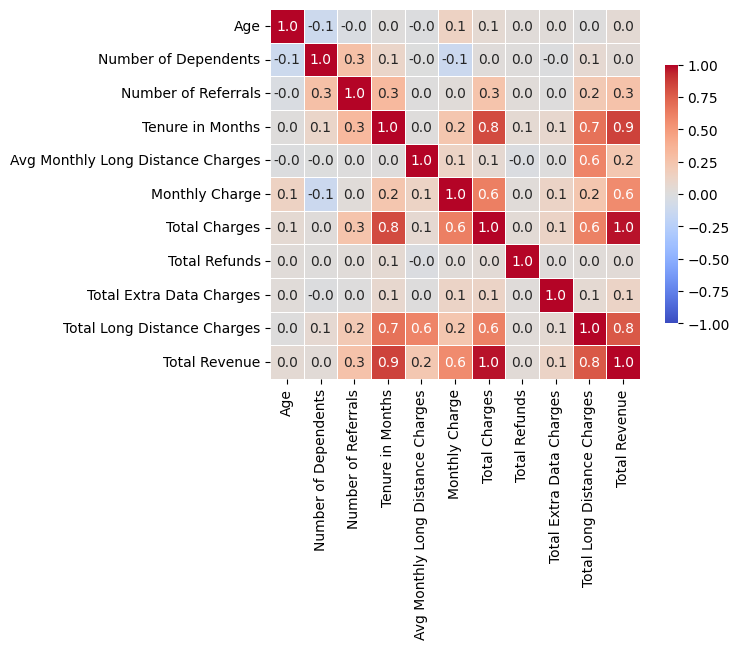

In [26]:
numerical = df.select_dtypes(exclude='object')
sns.heatmap(numerical.corr(), cmap='coolwarm', vmax=1,vmin=-1, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .7},
            annot=True,
            fmt=".1f");

From the data dictionary file, we know that Total Revenue = Total Charges - Total Refunds + Total Extra Data Charges + Total Long Distance Charges

Also, from the matrix above, we see that - Tenure in Months 'correlates with' Total Revenue, Total Long Distance Charges, Total Charges 

The association can be shown as below:

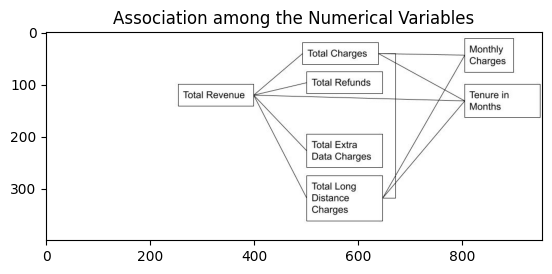

In [27]:
from matplotlib import image as mpimg

plt.title('Association among the Numerical Variables')
image = mpimg.imread("img/Chart.jpg")
plt.imshow(image)
plt.show()

We will keep the following variables - Monthly Charges, Tenure in Months, Total Extra Data Charges, Total Refunds.

We will drop the following variables - Total Revenue, Total Charges, Total Long Distance Charges.

In [28]:
df.drop(['Total Revenue', 'Total Charges', 'Total Long Distance Charges'], axis=1, inplace=True)

##### Convert Object type to Float

In [29]:
df['Avg Monthly GB Download'] = df['Avg Monthly GB Download'].astype(float)

##### Encoding Categorical Columns

We will apply binary encoding technique to keep control on the high dimensionality of the dataframe after encoding the categorical columns

In [30]:
list(df.select_dtypes(['object']).columns)

['Gender',
 'Married',
 'City',
 'Offer',
 'Phone Service',
 'Multiple Lines',
 'Internet Service',
 'Internet Type',
 'Online Security',
 'Online Backup',
 'Device Protection Plan',
 'Premium Tech Support',
 'Streaming TV',
 'Streaming Movies',
 'Streaming Music',
 'Unlimited Data',
 'Contract',
 'Paperless Billing',
 'Payment Method',
 'Customer Status']

In [31]:
list(df.select_dtypes(['float64', 'int64']).columns)

['Age',
 'Number of Dependents',
 'Number of Referrals',
 'Tenure in Months',
 'Avg Monthly Long Distance Charges',
 'Avg Monthly GB Download',
 'Monthly Charge',
 'Total Refunds',
 'Total Extra Data Charges']

In [32]:
# copy the dataframe
df1 = pd.DataFrame(data=df)

In [33]:
import category_encoders as ce

In [34]:
encoder = ce.BinaryEncoder(cols = ['Gender',
 'Married',
 'City',
 'Offer',
 'Phone Service',
 'Multiple Lines',
 'Internet Service',
 'Internet Type',
 'Online Security',
 'Online Backup',
 'Device Protection Plan',
 'Premium Tech Support',
 'Streaming TV',
 'Streaming Movies',
 'Streaming Music',
 'Unlimited Data',
 'Contract',
 'Paperless Billing',
 'Payment Method'], return_df = True)
 
df1 = encoder.fit_transform(df1)

In [35]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 59 columns):
 #   Column                             Non-Null Count  Dtype  
---  ------                             --------------  -----  
 0   Gender_0                           7043 non-null   int64  
 1   Gender_1                           7043 non-null   int64  
 2   Age                                7043 non-null   int64  
 3   Married_0                          7043 non-null   int64  
 4   Married_1                          7043 non-null   int64  
 5   Number of Dependents               7043 non-null   int64  
 6   City_0                             7043 non-null   int64  
 7   City_1                             7043 non-null   int64  
 8   City_2                             7043 non-null   int64  
 9   City_3                             7043 non-null   int64  
 10  City_4                             7043 non-null   int64  
 11  City_5                             7043 non-null   int64

In [36]:
df1 = pd.get_dummies(df1, columns=['Customer Status'])

In [37]:
df1.shape

(7043, 61)

In [38]:
df['Customer Status'].compare(df1['Customer Status_Churned']).head(50)

,self,other
0,Stayed,False
1,Stayed,False
2,Churned,True
3,Churned,True
4,Churned,True
5,Stayed,False
6,Stayed,False
7,Stayed,False
8,Stayed,False
9,Stayed,False


Customer Status_Churned is our (New) column of interest

##### Upsampling Data with SMOTE

SMOTE (Synthetic Minority Oversampling Technique) is a popular method for upsampling minority classes in imbalanced data sets. It works by creating new synthetic data points for the minority class, rather than simply duplicating existing observations. This helps to reduce the risk of overfitting, which can occur when naive oversampling methods are used.

In [39]:
X = df1.drop(['Customer Status_Churned', 'Customer Status_Joined', 'Customer Status_Stayed'], axis=1)
y = df1['Customer Status_Churned']

In [40]:
from imblearn.over_sampling import SMOTEN
sampler = SMOTEN(random_state=0)
Xsm, ysm = sampler.fit_resample(X,y)

In [41]:
Xsm.shape, ysm.shape

((10348, 58), (10348,))

##### Train Test Split

In [42]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(Xsm, ysm, test_size=0.25, random_state=100, stratify=ysm)

In [43]:
X_train.shape, X_test.shape

((7761, 58), (2587, 58))

In [44]:
y_train.shape, y_test.shape

((7761,), (2587,))

##### Normalizing Numerical Variables

From the EDA of the numerical variables, we got the idea that none of the numerical variables follow the gaussian distribution. So, we will normalize our numerical values for training purpose.

To avoid data leakage, we will scale our training and testing set seperately.

In [45]:
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import MinMaxScaler

nrmalize = ColumnTransformer(transformers=[('scale', MinMaxScaler(), [
    'Age',
    'Number of Dependents',
    'Number of Referrals',
    'Tenure in Months',
    'Avg Monthly Long Distance Charges',
    'Avg Monthly GB Download',
    'Monthly Charge',
    'Total Refunds',
    'Total Extra Data Charges'
    ]),], remainder='passthrough')

X_train = nrmalize.fit_transform(X_train)
X_test = nrmalize.transform(X_test)

## Data Modeling

### Training Different Classifier for Classification:

In [46]:
import pandas as pd
import numpy as np
import os
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.model_selection import cross_val_score, KFold
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC

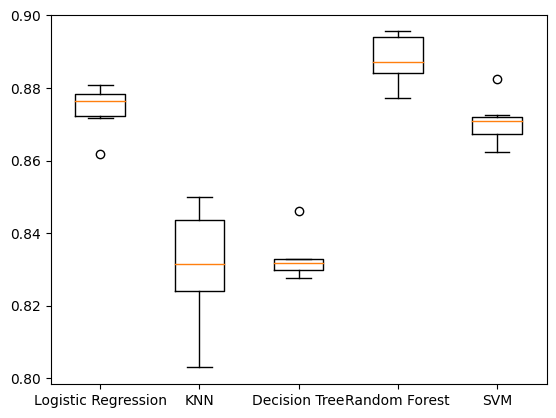

In [47]:
models = {"Logistic Regression": LogisticRegression(solver = 'newton-cg', max_iter = 500, C = 1000),
          "KNN": KNeighborsClassifier(),
          "Decision Tree": DecisionTreeClassifier(),
          "Random Forest": RandomForestClassifier(),
          "SVM": SVC(gamma='auto')
          }

results = []

for model in models.values():
    kf = KFold(n_splits=6, random_state=42, shuffle=True)
    cv_results = cross_val_score(model, X_train, y_train, cv=kf)
    results.append(cv_results)

plt.boxplot(results, labels=models.keys())
plt.show()

### Check the Performance Metrics

In [53]:
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix

m_score = []
m_name = []
for name, model in models.items():
    model.fit(X_train, y_train)
    test_score = model.score(X_test, y_test)
    prediction = model.predict(X_test)
    report = classification_report(prediction, y_test)
    mat = confusion_matrix(prediction, y_test)
    m_name.append(name)
    m_score.append(test_score)
    print("{} Test Set Accuracy: {}".format(name, test_score))
    print("{} Confusion Matrix:\n{}".format(name, mat))
    print("{} Classification Report:\n{}".format(name, report))

Logistic Regression Test Set Accuracy: 0.8824893699265559
Logistic Regression Confusion Matrix:
[[1146  156]
 [ 148 1137]]
Logistic Regression Classification Report:
              precision    recall  f1-score   support

       False       0.89      0.88      0.88      1302
        True       0.88      0.88      0.88      1285

    accuracy                           0.88      2587
   macro avg       0.88      0.88      0.88      2587
weighted avg       0.88      0.88      0.88      2587

KNN Test Set Accuracy: 0.8353304986470815
KNN Confusion Matrix:
[[ 997  129]
 [ 297 1164]]
KNN Classification Report:
              precision    recall  f1-score   support

       False       0.77      0.89      0.82      1126
        True       0.90      0.80      0.85      1461

    accuracy                           0.84      2587
   macro avg       0.84      0.84      0.83      2587
weighted avg       0.84      0.84      0.84      2587

Decision Tree Test Set Accuracy: 0.8477000386548125
Decision T

In [54]:
acc_df = pd.DataFrame({'Model_Name': m_name, 'Model_Accuracy': m_score})

In [56]:
acc_df.head(6)

,Model_Name,Model_Accuracy
0,Logistic Regression,0.882489
1,KNN,0.835330
2,Decision Tree,0.847700
3,Random Forest,0.894472
4,SVM,0.878624


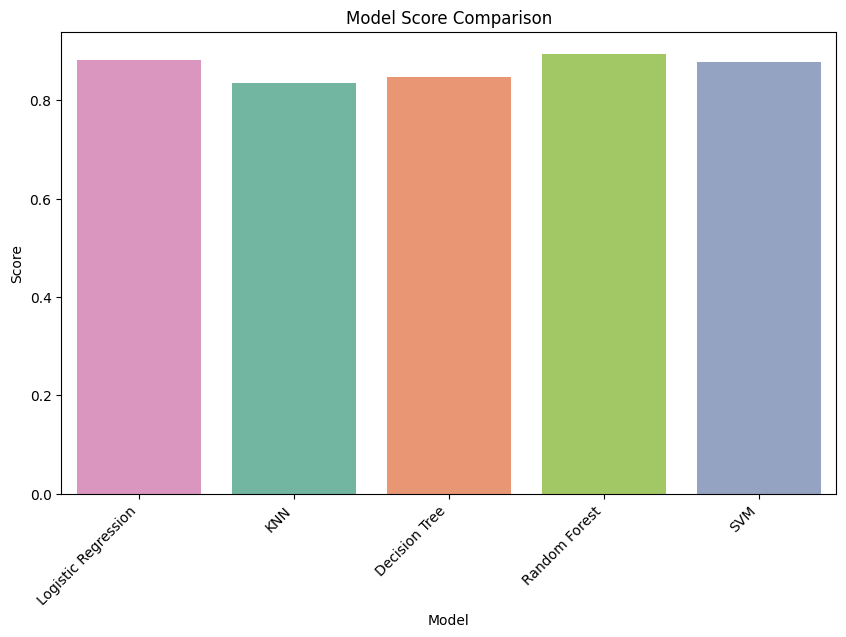

In [65]:
plt.figure(figsize=(10, 6))
sns.barplot(x='Model_Name', y='Model_Accuracy', data=acc_df, hue='Model_Accuracy', legend=False, palette='Set2')
plt.xlabel('Model')
plt.ylabel('Score')
plt.title('Model Score Comparison')
plt.xticks(rotation=45, ha='right')
plt.show()

### Plot the ROC and Precision-Recall Curve

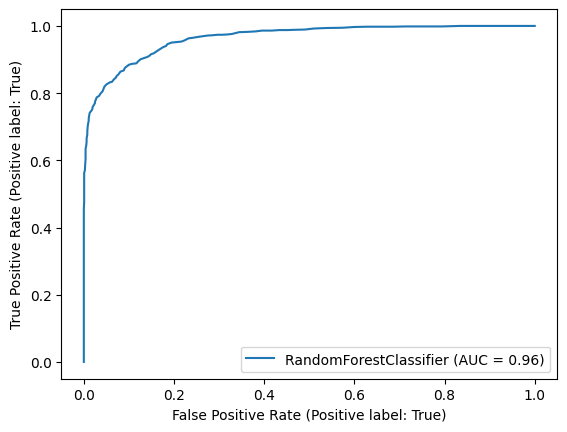

In [66]:
from sklearn.metrics import RocCurveDisplay

rf=RandomForestClassifier()
rf.fit(X_train, y_train)

RocCurveDisplay.from_estimator(rf, X_test, y_test)

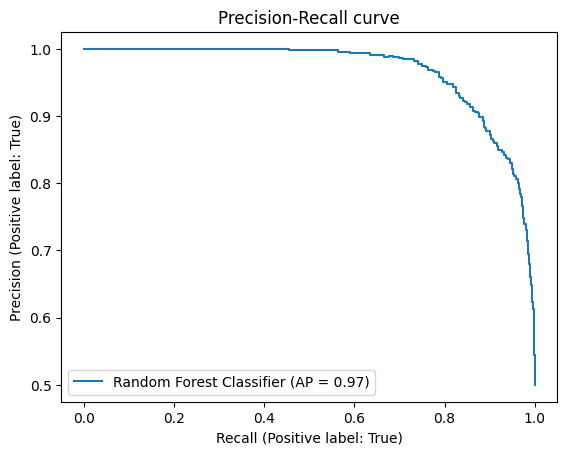

In [67]:
from sklearn.metrics import PrecisionRecallDisplay

display = PrecisionRecallDisplay.from_estimator(
    rf, X_test, y_test, name="Random Forest Classifier")
_ = display.ax_.set_title("Precision-Recall curve")

#### Consideration of the Performance Metrices

We know that, this dataset is an Imbalanced-class Classification problem. For this reson, we would emphasize on different performance metrices to compare the performances. 

* **Accuracy Score** - It calculates the overall accuracy of the model for training and test datasets. However, in unbalanced datasets, accuracy becomes a poorer metric.
* **Precision and Recall** Precision (correctness of a positive prediction) can be seen as a measure of quality, and Recall as a measure of quantity. 
* **F1 Score** The F1 score is the harmonic mean of precision and recall and thereby measures the percentage of correct predictions that a machine learning model has made. It is more suitable for imbalanced data.


For this binary-class dataset, our variable of interest is Customer Churn Status (i.e. 1 if the Customer Churned, 0 elsewise). In this context, the Precision and Recall indices can be explained as - 

$$ Precision = \frac{\text{True Positive}} {\text{True Positive + False Positive}}\ $$

$$\\= \frac{\text{Customers who churned and was expected to churn}}{\text{Customers who churned and expected to churn + Customers didn't churned but were predicted to churn}} $$

Similarly, 

$$ Recall = \frac{\text{True Positive}} {\text{True Positive + False Negative}}\ $$

$$\\= \frac{\text{Customers who churned and was expected to churn}}{\text{Customers who churned and expected to churn + Customers who churned but were predicted not to churn}} $$

For in terms of business policy planning and design, it's the management's call to decide on which performance metrices should be prioritize (Precision or Recall); in other words- which segment of customers should we target to churn. This will help to contribute towards developing effective customer retention policies for the company.

Observation:
1. The from the Boxplot, we observe that Random Forest Classifier most consistently as classifiers.
2. The Accuracy Score for Random Forest is 89.71% and F1 score is 90%.
3. From the ROC Curve for Random Forest above, we see that the AUC is 97%.

In terms of model performance and F1 score, we would consider Random Forest Classifer as our best performer classifier.

### Finding Important Features:

Text(0.5, 1.0, 'Feature Importance')

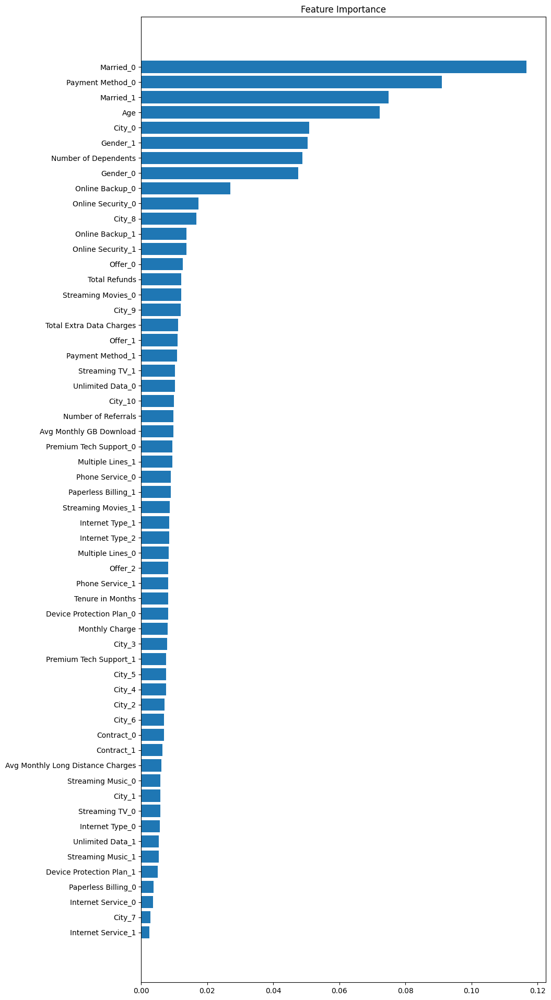

In [68]:
feature_importance = rf.feature_importances_
sorted_idx = np.argsort(feature_importance)
fig = plt.figure(figsize=(10, 24))
plt.barh(range(len(sorted_idx)), feature_importance[sorted_idx], align='center')
plt.yticks(range(len(sorted_idx)), np.array(X.columns)[sorted_idx])
plt.title('Feature Importance')

Observation:

From the Feature Importance graph for Random Forest Classifier, we observe that the top most important factors that contribute towards churn are-

* Marital Status
* Payment Method
* City
* Gender
* Number of Dependents 
etc.

In [70]:
import statsmodels.api as stat

logit_model=stat.Logit(y,X)
result=logit_model.fit()
print(result.summary())

         Current function value: 0.343471
         Iterations: 35
                              Logit Regression Results                             
Dep. Variable:     Customer Status_Churned   No. Observations:                 7043
Model:                               Logit   Df Residuals:                     6999
Method:                                MLE   Df Model:                           43
Date:                     Tue, 04 Jun 2024   Pseudo R-squ.:                  0.4064
Time:                             15:15:03   Log-Likelihood:                -2419.1
converged:                           False   LL-Null:                       -4075.1
Covariance Type:                 nonrobust   LLR p-value:                     0.000
                                        coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------
Gender_0                              0.0736        nan   

c:\Users\Ali Abdullah\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


In [71]:
X = X.drop(X.filter(regex='_0').columns, axis=1)

In [72]:
logit_model=stat.Logit(y,X)
result=logit_model.fit()
print(result.summary())

Optimization terminated successfully.
         Current function value: 0.349768
         Iterations 8
                              Logit Regression Results                             
Dep. Variable:     Customer Status_Churned   No. Observations:                 7043
Model:                               Logit   Df Residuals:                     7004
Method:                                MLE   Df Model:                           38
Date:                     Tue, 04 Jun 2024   Pseudo R-squ.:                  0.3955
Time:                             15:15:42   Log-Likelihood:                -2463.4
converged:                            True   LL-Null:                       -4075.1
Covariance Type:                 nonrobust   LLR p-value:                     0.000
                                        coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------
Gender_1              

Observation:

The Label Binarizer Encoded the Categorical Variables according to importance. But, the features are not dummy variables so the introduce mutlicollinearity in the model. If we proceed with dummy encoding, the features with low responses lead to a misleading interpretation regarding the co-efficients for Logistic Regression models.


Overall, the important feature selection didn't work well due to labelbinarizing.